# Index

* [Data Preparation](#data_prepare)
    - [Missing Values](#missing_values)
    - [Feature Engineering](#feat_engineering)
        - [Wind Velocity related features](#wind_feat)
        - [Time related features](#time_feat)
        - [EDA of new features](#new_feat_eda)
        - [Feature Importance](#feat_importance)
        - [Feature transformations](#feat_transformation)
    - [Target transformation](#target_transfomation)
    - [Outliers and abnormal data](#outliers)
    - [Pipeline](#pipe)

In [9]:
# Libraries

%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import pandas as pd
import numpy as np
import datetime as dt
import gc
import missingno as msno
import pandas_profiling
import statsmodels as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import random

from src.functions import data_import as dimp
from src.functions import data_exploration as dexp
from src.functions import data_transformation as dtr
from src.functions import utils as utl

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pty
import re

import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Data Preparation
<a id="data_prepare"></a>

We'll create a pipeline with scikit learn to perform the data preparation including the transformations identified in EDA, recall here:
* Input missing values
* Create new features:
    - Wind related features
        - Wind velocity module.
        - Wind direction.
        - Wind velocity escaled to heigth of the turbine. We can calculate it by using the *Hellmann power equation*:
    
            $$u(z) = u(z_0)\left(\frac{z}{z_0}\right)^{\alpha},$$ 
      
          with $\alpha = 1/7$, $z_0 = 100$ or $10$ meters, depending on the NWP data, and $z = 50$ m, the height of the 
          turbines.
          
    - Date time future enconding to capture seasonality:
        - Diurnal variations of average wind speeds (hour feature).
        - Monthly variations of averge wind speeds  (month feature).


* Stardard Scaling of variables
* Temperature `T` in $^\text{o}$C instead of Kelvin
* Outliers and abnormal data:
    - Abnormal data: `CLCT` negative values.
    - Outliers: using power curve as a reference to deal with typical outlier types in this context:
        - Data points in low wind speed period with high power generation.
        - Data points with negtative value wind speed.
        - Data points with negative valu power generation.
        - Data points with low power generation at high wind speed period.
* Feature selection

In [13]:
X_train_raw = catalog.load("X_train_raw")
X_test_raw = catalog.load("X_test_raw")
y_train_raw = catalog.load("y_train_raw")

2020-08-25 12:45:10,356 - kedro.io.data_catalog - INFO - Loading data from `X_train_raw` (CSVDataSet)...
2020-08-25 12:45:10,671 - kedro.io.data_catalog - INFO - Loading data from `X_test_raw` (CSVDataSet)...
2020-08-25 12:45:10,886 - kedro.io.data_catalog - INFO - Loading data from `y_train_raw` (CSVDataSet)...


In [17]:
# Select rows only for WF1
X_train = X_train[X_train.WF == 'WF1']
X_test = X_test_2[X_test_2.WF == 'WF1']
y_train = Y_train_2[Y_train_2.ID.isin(X_train.ID)]
y_test = Y_test_2[Y_test_2.ID.isin(X_test.ID)]

In [4]:
# Keep IDs separately
ID_X_train = X_train['ID']
ID_X_test = X_test['ID']
ID_y_train = y_train['ID']
ID_y_test = y_test['ID']

In [18]:
X_test.columns[3:]

Index(['V', 'T', 'CLCT'], dtype='object')

In [15]:
X_train.columns[3:]

AttributeError: 'tuple' object has no attribute 'columns'

## Missing Values
<a id="missing_values"></a>

**Assumption**: Meteorological forecasts accuracy and reliability are the highest for Forecast Day `D` and Run `18h` (the shorter the gap time between NWP Run and the time forecasted, the higher the realiability).


For `X_train`:
We'll use whenever it's possible, data from forecast day `D` and run `18h` for every `NWP` as they're the most recent data available. When there're missing values, we'll use the corresponding data from previous days to fill in the gap, sequencely.

Moreover, `NWP2` and `NWP3` provides data every 3 hours, instead of every 1 hour, as `NWP1` and `NWP4` do. 
* `NWP1`: day 13/07/2018 is fully missing. We'll use `D-1` forecasts to input these values.
* `NWP4`: day 15/05/2018 is fully missing. We'll use `D-1` forecasts to input these values.
* `NWP2` and `NWP3`: we will interpolate these values, missing three hours in between every data.

For `X_test`:
The rules of the challenge point out that we can only use data available on day `D` at 09:00 h (practically that means forecast from day `D-1` and Run 00h). We have then the following missing values to input:

* `NWP1` and `NWP4`: no missing values for the most recent data (forecast day D-1, Run 00h).
* `NWP2` and `NWP3`: we will interpolate these values, missing three hours in between every data 

In [6]:
# We'll add new columns NWPX_<met_var> without missing values
new_cols = ['NWP1_U', 'NWP1_V', 'NWP1_T', 'NWP2_U', 
            'NWP2_V', 'NWP3_U', 'NWP3_V', 'NWP3_T',
            'NWP4_U', 'NWP4_V', 'NWP4_CLCT']      

In [7]:
# input missing values in X_train
X_train_cpy = X_train.copy()
cols_train = X_train_cpy.columns[3:] 
new_cols = ['NWP1_U','NWP1_V','NWP1_T',
           'NWP2_U','NWP2_V',
           'NWP3_U','NWP3_V','NWP3_T',
           'NWP4_U','NWP4_V','NWP4_CLCT']

dtr.add_new_cols(new_cols, X_train_cpy)
dtr.input_missing_values(X_train_cpy, cols_train)

col_list = ['NWP2_U','NWP2_V','NWP3_U','NWP3_V','NWP3_T']
dtr.interpolate_missing_values(X_train_cpy, col_list, 'Time')

AttributeError: 'NoneType' object has no attribute 'group'

Let's check the consistency of the data after the missing values inputation.

In [8]:
X_train[['NWP4_00h_D_U','NWP4_12h_D_U']].head(30)

KeyError: "None of [Index(['NWP4_00h_D_U', 'NWP4_12h_D_U'], dtype='object')] are in the [columns]"

In [10]:
X_train_cpy[new_cols].head(10)

,NWP1_U,NWP1_V,NWP1_T,NWP2_U,NWP2_V,NWP3_U,NWP3_V,NWP3_T,NWP4_U,NWP4_V,NWP4_CLCT
0,-2.248047,-3.257812,286.50,2.611328,-2.341797,-1.149414,-2.275391,286.000000,1.254883,-0.289795,82.5625
1,-2.433594,-1.446289,286.25,2.611328,-2.341797,-1.149414,-2.275391,286.000000,2.490234,-0.413330,100.0000
2,3.365234,-3.060547,285.75,2.611328,-2.341797,-1.149414,-2.275391,286.000000,0.997070,-1.415039,98.3750
3,3.707031,-6.218750,284.75,3.178385,-2.783203,-0.519206,-2.721354,285.666667,0.689453,-0.961426,94.8750
4,3.812500,-5.445312,284.50,3.745443,-3.224609,0.111003,-3.167318,285.333333,0.291016,-0.294922,95.8750
5,4.640625,-4.996094,284.00,4.312500,-3.666016,0.741211,-3.613281,285.000000,0.265137,-0.170654,65.3750
6,2.677734,-5.796875,284.25,3.125814,-3.751953,0.913411,-3.625651,285.333333,1.230469,-0.128540,75.1875
7,0.777832,-5.265625,285.00,1.939128,-3.837891,1.085612,-3.638021,285.666667,2.703125,-0.072815,90.9375
8,1.395508,-4.359375,286.00,0.752441,-3.923828,1.257812,-3.650391,286.000000,3.205078,-0.791504,100.0000
9,1.905273,-2.871094,287.25,1.609049,-3.763021,1.516927,-3.821615,286.333333,3.257812,-2.164062,96.8750


All seems OK for `X_train`.

In [11]:
# input missing values in X_test
X_test_cpy = X_test.copy()
cols_test = X_test_cpy.columns[3:-9] 

dtr.add_new_cols(new_cols, X_test_cpy)
dtr.input_missing_values(X_test_cpy, cols_test)

col_list = ['NWP2_U','NWP2_V','NWP3_U','NWP3_V','NWP3_T']
dtr.interpolate_missing_values(X_test_cpy, col_list, 'Time')

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP1_V,NWP1_T,NWP2_U,NWP2_V,NWP3_U,NWP3_V,NWP3_T,NWP4_U,NWP4_V,NWP4_CLCT
0,2018-11-14 00:00:00,4727,WF1,-2.121094,-2.443359,287.50,-1.804688,-3.511719,287.00,-2.726562,...,0.379883,288.75,-0.897461,-1.253906,-0.352295,-1.959961,288.750000,-0.858398,-1.210938,95.062500
1,2018-11-14 01:00:00,4728,WF1,-1.703125,-0.535645,287.00,-1.742188,-2.023438,286.75,-2.023438,...,-0.440430,288.00,-1.414062,-1.431966,-0.825358,-1.737956,288.583333,-0.873047,-1.086914,81.750000
2,2018-11-14 02:00:00,4729,WF1,-1.638672,0.705566,287.00,-1.274414,-0.818359,286.50,-1.580078,...,-0.799316,287.75,-1.930664,-1.610026,-1.298421,-1.515951,288.416667,-1.116211,-1.001953,68.187500
3,2018-11-14 03:00:00,4730,WF1,-1.932617,1.438477,287.00,-1.029297,-0.264404,286.25,-1.255859,...,-0.858398,287.75,-2.447266,-1.788086,-1.771484,-1.293945,288.250000,-1.006836,-1.557617,89.062500
4,2018-11-14 04:00:00,4731,WF1,-2.136719,2.640625,286.75,-1.157227,0.812012,286.25,-1.219727,...,-0.468506,288.25,-2.731771,-1.382650,-2.182943,-1.111816,288.250000,-1.318359,-1.072266,99.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,2019-01-15 20:00:00,6235,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.347412,...,-7.687500,280.25,0.367025,-7.042969,-1.071777,-4.299479,281.916667,0.183105,-2.572266,-0.000013
1509,2019-01-15 21:00:00,6236,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.261230,...,-6.777344,279.75,0.378906,-6.625000,-1.303711,-3.578125,281.750000,-0.240601,-2.255859,-0.000013
1510,2019-01-15 22:00:00,6237,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.230469,...,-5.277344,279.50,-0.348633,-4.886719,-1.655599,-2.932617,281.583333,-0.798340,-2.119141,-0.000013
1511,2019-01-15 23:00:00,6238,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-0.038696,...,-3.085938,279.25,-1.076172,-3.148438,-2.007487,-2.287109,281.416667,-0.444824,-1.904297,0.082397


In [12]:
X_test_cpy[new_cols]

,NWP1_U,NWP1_V,NWP1_T,NWP2_U,NWP2_V,NWP3_U,NWP3_V,NWP3_T,NWP4_U,NWP4_V,NWP4_CLCT
0,-0.775879,0.379883,288.75,-0.897461,-1.253906,-0.352295,-1.959961,288.750000,-0.858398,-1.210938,95.062500
1,-1.058594,-0.440430,288.00,-1.414062,-1.431966,-0.825358,-1.737956,288.583333,-0.873047,-1.086914,81.750000
2,-1.458008,-0.799316,287.75,-1.930664,-1.610026,-1.298421,-1.515951,288.416667,-1.116211,-1.001953,68.187500
3,-1.546875,-0.858398,287.75,-2.447266,-1.788086,-1.771484,-1.293945,288.250000,-1.006836,-1.557617,89.062500
4,-1.562500,-0.468506,288.25,-2.731771,-1.382650,-2.182943,-1.111816,288.250000,-1.318359,-1.072266,99.750000
...,...,...,...,...,...,...,...,...,...,...,...
1508,-2.546875,-7.687500,280.25,0.367025,-7.042969,-1.071777,-4.299479,281.916667,0.183105,-2.572266,-0.000013
1509,-3.097656,-6.777344,279.75,0.378906,-6.625000,-1.303711,-3.578125,281.750000,-0.240601,-2.255859,-0.000013
1510,-3.261719,-5.277344,279.50,-0.348633,-4.886719,-1.655599,-2.932617,281.583333,-0.798340,-2.119141,-0.000013
1511,-3.345703,-3.085938,279.25,-1.076172,-3.148438,-2.007487,-2.287109,281.416667,-0.444824,-1.904297,0.082397


All seems OK also for `X_test`

## Feature Engineering
<a id="feat_engineering"></a>

### Wind Velocity related features
<a id="wind_feat"></a>

Adding the following wind velocity derived features for each NWP:
* `NWP<1,2,3,4>_wvel`
* `NWP<1,2,3,4>_wvel`
* `NWP<1,2,3,4>_wshear`
* `NWP<1,2,3,4>_wdir`
* `NWP<1,2,3,4>_wdir_sin`
* `NWP<1,2,3,4>_wdir_cos`

In [13]:
# Add wind velocity related features in X_train_cpy
regex = r'NWP(?P<NWP>\d{1})_(?P<met_var>[UV])'
dtr.add_wind_vars(X_train_cpy, regex)

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP3_wvel,NWP3_wdir,NWP3_wdir_sin,NWP3_wdir_cos,NWP3_wshear,NWP4_wvel,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear
0,2018-05-01 01:00:00,1,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.549226,26.800633,0.450887,0.892581,2.313472,1.287910,283.003572,-0.974356,0.225012,1.613397
1,2018-05-01 02:00:00,2,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.549226,26.800633,0.450887,0.892581,2.313472,2.524304,279.424060,-0.986503,0.163740,3.162259
2,2018-05-01 03:00:00,3,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.549226,26.800633,0.450887,0.892581,2.313472,1.731036,324.830561,-0.575996,0.817452,2.168512
3,2018-05-01 04:00:00,4,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.770441,10.801618,0.187409,0.982282,2.514228,1.183083,324.355114,-0.582760,0.812644,1.482078
4,2018-05-01 05:00:00,5,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.169262,357.992819,-0.035025,0.999386,2.876166,0.414330,315.381966,-0.702377,0.711805,0.519041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4721,2018-11-13 19:00:00,4722,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-1.930664,...,2.326574,334.668314,-0.427858,0.903846,2.111410,1.552014,4.197029,0.073186,0.997318,1.944247
4722,2018-11-13 20:00:00,4723,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-1.694336,...,2.331113,338.350135,-0.368934,0.929456,2.115530,1.759022,9.410028,0.163499,0.986544,2.203571
4723,2018-11-13 21:00:00,4724,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-1.941406,...,2.345218,342.002645,-0.308973,0.951071,2.128331,1.980084,6.641327,0.115654,0.993290,2.480501
4724,2018-11-13 22:00:00,4725,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-2.271484,...,2.345218,342.002645,-0.308973,0.951071,2.128331,1.949398,9.639273,0.167445,0.985881,2.442059


In [14]:
# Add wind velocity related features in X_test_cpy
dtr.add_wind_vars(X_test_cpy, regex)

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP3_wvel,NWP3_wdir,NWP3_wdir_sin,NWP3_wdir_cos,NWP3_wshear,NWP4_wvel,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear
0,2018-11-14 00:00:00,4727,WF1,-2.121094,-2.443359,287.50,-1.804688,-3.511719,287.00,-2.726562,...,1.991371,10.189871,0.176911,0.984227,1.807207,1.484324,35.331721,0.578309,0.815818,1.859450
1,2018-11-14 01:00:00,4728,WF1,-1.703125,-0.535645,287.00,-1.742188,-2.023438,286.75,-2.023438,...,1.923982,25.403121,0.428984,0.903312,1.746050,1.394128,38.772632,0.626231,0.779637,1.746459
2,2018-11-14 02:00:00,4729,WF1,-1.638672,0.705566,287.00,-1.274414,-0.818359,286.50,-1.580078,...,1.995997,40.580264,0.650513,0.759495,1.811405,1.499946,48.087651,0.744168,0.667993,1.879020
3,2018-11-14 03:00:00,4730,WF1,-1.932617,1.438477,287.00,-1.029297,-0.264404,286.25,-1.255859,...,2.193730,53.854487,0.807522,0.589838,1.990852,1.854694,32.878425,0.542858,0.839824,2.323422
4,2018-11-14 04:00:00,4731,WF1,-2.136719,2.640625,286.75,-1.157227,0.812012,286.25,-1.219727,...,2.449770,63.009345,0.891081,0.453845,2.223213,1.699360,50.877393,0.775797,0.630982,2.128831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,2019-01-15 20:00:00,6235,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.347412,...,4.431053,13.997450,0.241879,0.970306,4.021265,2.578775,355.928296,-0.071005,0.997476,3.230496
1509,2019-01-15 21:00:00,6236,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.261230,...,3.808233,20.019509,0.342340,0.939576,3.456045,2.268654,6.087915,0.106054,0.994360,2.842000
1510,2019-01-15 22:00:00,6237,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.230469,...,3.367677,29.446751,0.491614,0.870813,3.056232,2.264532,20.642802,0.352541,0.935796,2.836836
1511,2019-01-15 23:00:00,6238,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-0.038696,...,3.043168,41.274714,0.659670,0.751555,2.761734,1.955560,13.147954,0.227466,0.973786,2.449779


### Time related features 
<a id="time_feat"></a>

Adding the following date time velocity derived features:
* `hour`
* `month`
* `hour_sin`
* `hour_cos`

In [15]:
# Add time related features in X_train_cpy
dtr.add_time_vars(X_train_cpy, 'Time')

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos
0,2018-05-01 01:00:00,1,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,283.003572,-0.974356,0.225012,1.613397,1,5,0.258819,0.965926,0.5,-0.866025
1,2018-05-01 02:00:00,2,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,279.424060,-0.986503,0.163740,3.162259,2,5,0.500000,0.866025,0.5,-0.866025
2,2018-05-01 03:00:00,3,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,324.830561,-0.575996,0.817452,2.168512,3,5,0.707107,0.707107,0.5,-0.866025
3,2018-05-01 04:00:00,4,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,324.355114,-0.582760,0.812644,1.482078,4,5,0.866025,0.500000,0.5,-0.866025
4,2018-05-01 05:00:00,5,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,315.381966,-0.702377,0.711805,0.519041,5,5,0.965926,0.258819,0.5,-0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4721,2018-11-13 19:00:00,4722,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-1.930664,...,4.197029,0.073186,0.997318,1.944247,19,11,-0.965926,0.258819,-0.5,0.866025
4722,2018-11-13 20:00:00,4723,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-1.694336,...,9.410028,0.163499,0.986544,2.203571,20,11,-0.866025,0.500000,-0.5,0.866025
4723,2018-11-13 21:00:00,4724,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-1.941406,...,6.641327,0.115654,0.993290,2.480501,21,11,-0.707107,0.707107,-0.5,0.866025
4724,2018-11-13 22:00:00,4725,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-2.271484,...,9.639273,0.167445,0.985881,2.442059,22,11,-0.500000,0.866025,-0.5,0.866025


In [16]:
# Add time related features in X_test_cpy
dtr.add_time_vars(X_test_cpy, 'Time')

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos
0,2018-11-14 00:00:00,4727,WF1,-2.121094,-2.443359,287.50,-1.804688,-3.511719,287.00,-2.726562,...,35.331721,0.578309,0.815818,1.859450,0,11,0.000000,1.000000,-0.5,0.866025
1,2018-11-14 01:00:00,4728,WF1,-1.703125,-0.535645,287.00,-1.742188,-2.023438,286.75,-2.023438,...,38.772632,0.626231,0.779637,1.746459,1,11,0.258819,0.965926,-0.5,0.866025
2,2018-11-14 02:00:00,4729,WF1,-1.638672,0.705566,287.00,-1.274414,-0.818359,286.50,-1.580078,...,48.087651,0.744168,0.667993,1.879020,2,11,0.500000,0.866025,-0.5,0.866025
3,2018-11-14 03:00:00,4730,WF1,-1.932617,1.438477,287.00,-1.029297,-0.264404,286.25,-1.255859,...,32.878425,0.542858,0.839824,2.323422,3,11,0.707107,0.707107,-0.5,0.866025
4,2018-11-14 04:00:00,4731,WF1,-2.136719,2.640625,286.75,-1.157227,0.812012,286.25,-1.219727,...,50.877393,0.775797,0.630982,2.128831,4,11,0.866025,0.500000,-0.5,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,2019-01-15 20:00:00,6235,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.347412,...,355.928296,-0.071005,0.997476,3.230496,20,1,-0.866025,0.500000,0.5,0.866025
1509,2019-01-15 21:00:00,6236,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.261230,...,6.087915,0.106054,0.994360,2.842000,21,1,-0.707107,0.707107,0.5,0.866025
1510,2019-01-15 22:00:00,6237,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.230469,...,20.642802,0.352541,0.935796,2.836836,22,1,-0.500000,0.866025,0.5,0.866025
1511,2019-01-15 23:00:00,6238,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-0.038696,...,13.147954,0.227466,0.973786,2.449779,23,1,-0.258819,0.965926,0.5,0.866025


### Temperature conversion to $^{\text{o}}$C
<a id="temp_conv"></a>

Just for an easier interpretation of temperature data, we'll convert it to Celsius.

In [17]:
X_train_cpy[['NWP1_T','NWP3_T']].head()

,NWP1_T,NWP3_T
0,286.50,286.000000
1,286.25,286.000000
2,285.75,286.000000
3,284.75,285.666667
4,284.50,285.333333


### EDA of new features
<a id="new_feat_eda"></a>

Let's come back to EDA now to visualize the distributions, dependencies and behaviour of the new added features.

#### Wind velocity distributions

In [18]:
df_eda = X_train_cpy.copy()
df_eda['Production'] = y_train['Production'].copy()

In [19]:
import plotly.figure_factory as ff

# Group data together
hist_data = [df_eda['NWP1_wvel'],df_eda['NWP2_wvel'],df_eda['NWP3_wvel'],df_eda['NWP4_wvel']]
group_labels = ['NWP1 wind vel', 'NWP2 wind vel', 'NWP3 wind vel', 'NWP4 wind vel']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)
fig.show()

#### Time dependency

In [20]:
# Time series visualization
df_eda['NWP3_T_cels'] = df_eda['NWP3_T'] - 273
df_eda[
    ['Time','NWP1_wvel','NWP1_wdir', 'NWP3_T_cels']].set_index('Time').iplot(
    kind='scatter', 
    filename='cufflinks/cf-simple-line'
)

In [21]:
df_eda.loc[df_eda['NWP3_wvel'] == max(df_eda['NWP3_wvel'])]

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos,Production,NWP3_T_cels
3695,2018-10-02,3696,WF1,7.269531,-17.984375,288.25,9.398438,-20.578125,288.0,5.9375,...,0.917451,17.121343,0,10,0.0,1.0,-0.866025,0.5,6.339844,13.0


In [22]:
df_eda.loc[df_eda['NWP3_wvel'] == min(df_eda['NWP3_wvel'])]

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos,Production,NWP3_T_cels
792,2018-06-03 01:00:00,793,WF1,-0.565918,1.198242,292.0,-0.95166,0.063416,292.0,-0.428955,...,-0.543764,1.581614,1,6,0.258819,0.965926,1.224647e-16,-1.0,0.010002,19.833333


#### Dependency between wind power and wind velocity

In [23]:
fig = make_subplots(rows=2, 
                    cols=2, 
                    start_cell="top-left",
                    x_title='wind velocity [m/s]',
                    y_title='wind power [MWh]')

fig.add_trace(go.Scatter(x=df_eda['NWP1_wvel'], y=df_eda['Production'], mode="markers", marker=dict(size=3), name='NWP1'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=df_eda['NWP2_wvel'], y=df_eda['Production'], mode="markers", marker=dict(size=3), name='NWP2'),
              row=1, col=2)

fig.add_trace(go.Scatter(x=df_eda['NWP3_wvel'], y=df_eda['Production'], mode="markers", marker=dict(size=3), name='NWP3'),
              row=2, col=1)

fig.add_trace(go.Scatter(x=df_eda['NWP4_wvel'], y=df_eda['Production'], mode="markers", marker=dict(size=3),  name='NWP4'),
              row=2, col=2)

fig.update_layout(height=800, width=800)

fig.show()

#### Wind direction distribution

C:\Users\Quark\.conda\envs\TFM-env\lib\site-packages\windrose\windrose.py:30: MatplotlibDeprecationWarning:


The Appender class was deprecated in Matplotlib 3.1 and will be removed in 3.3.

C:\Users\Quark\.conda\envs\TFM-env\lib\site-packages\windrose\windrose.py:31: MatplotlibDeprecationWarning:


The copy_dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use docstring.copy() and cbook.dedent() instead.

C:\Users\Quark\.conda\envs\TFM-env\lib\site-packages\windrose\windrose.py:31: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.getdoc() instead.

C:\Users\Quark\.conda\envs\TFM-env\lib\site-packages\windrose\windrose.py:31: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.



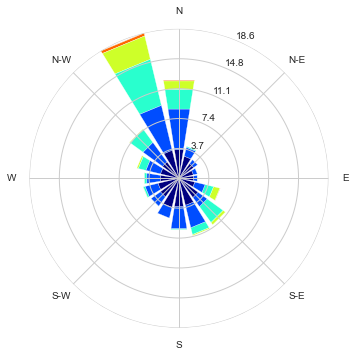

In [24]:
import windrose
import matplotlib.cm as cm

fig = plt.figure()

ax = fig.add_subplot(111, projection="windrose")
ax.bar(df_eda['NWP1_wdir'], df_eda['NWP1_wvel'], normed=True, opening=0.8, edgecolor='white')
# ax.set_legend()

plt.show()

In [25]:
fig = make_subplots(rows=1, 
                    cols=1, 
                    start_cell="top-left",
                    x_title='wind direction',
                    y_title='wind power production [MWh]')

fig.add_trace(go.Scatter(x=df_eda['NWP1_wdir'], y=df_eda['Production'], mode="markers", marker=dict(size=3), name='NWP1'),
              row=1, col=1)


#### Wind velocity and direction versus power production

In [26]:
import plotly.express as px

fig = go.Figure(data=[go.Scatter3d(
    x=df_eda['NWP1_wvel'],
    y=df_eda['NWP1_wdir'],
    z=df_eda['Production'],
    mode='markers',
    marker=dict(
        size=3,
        color=df_eda['Production'],            
        colorscale='Viridis', 
        opacity=0.8
    )
)])

fig.update_layout(autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

#### Visualization of dependencies between wind power and meteorological variables (T and CLCT)

In [27]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, 
                    cols=2, 
                    start_cell="top-left",
                    x_title='air temperature [K]',
                    y_title='power production [MWh]')

fig.add_trace(go.Scatter(x=df_eda['NWP1_T'], y=df_eda['Production'], mode="markers", marker=dict(size=3), name='NWP1'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=df_eda['NWP3_T'], y=df_eda['Production'], mode="markers", marker=dict(size=3), name='NWP3'),
              row=1, col=2)

fig.update_layout(height=500, width=800)

fig.show()
                

In [28]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, 
                    cols=1, 
                    start_cell="top-left",
                    x_title='taotal cloud cover [%]',
                    y_title='power production[MWh]')

fig.add_trace(go.Scatter(x=df_eda['NWP4_CLCT'], 
                         y=df_eda['Production'], 
                         mode="markers", marker=dict(size=3), name='NWP4'),
              row=1, col=1)


fig.update_layout(height=500, width=800)

fig.show()

#### Correlation matrix

In [29]:
# Looking at correlations
df_eda[['Production','NWP1_U', 'NWP1_V','NWP1_wvel','NWP1_wshear',
        'NWP1_T','NWP1_wdir','NWP1_wdir_sin','NWP1_wdir_cos','month',
       'month_sin','month_cos', 'hour','hour_sin','hour_cos']].corr().iplot(
    kind='heatmap', 
    colorscale='spectral', 
    filename='cufflinks/simple-heatmap'
)

### Feature importance
<a id="feat_importance"></a>

Random Forest can be used to get the importance of the features in a dataset. We will drop all original features that are redudant with dervied ones (high correlated), for example, wind velocity, U and V if wind shear is included.

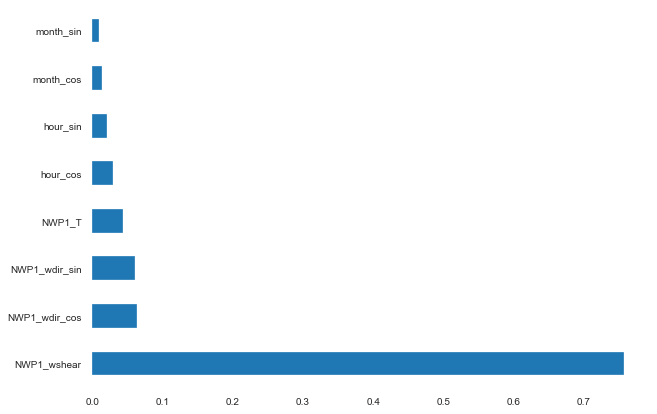

In [30]:
## Feature importance for NWP1

from sklearn.ensemble import  RandomForestRegressor
from sklearn.model_selection import train_test_split

# data
X = X_train_cpy[['NWP1_T',
                'NWP1_wshear','NWP1_wdir_cos','NWP1_wdir_sin',
                'hour_cos','hour_sin',
                'month_sin','month_cos']]
Y = y_train['Production']

# split into train and test sets
train_x, test_x, train_y, test_y = train_test_split(X, Y, test_size=0.20, random_state=0)

# instanciate object RandomForestRegressor
model_RFR_NWP1 = RandomForestRegressor()

# fit the model
model_RFR_NWP1.fit(train_x, train_y)

# plot feature importance
plt.figure(figsize=(10,7))
feat_importances = pd.Series(model_RFR_NWP1.feature_importances_, index = train_x.columns)
feat_importances.nlargest(50).plot(kind='barh')

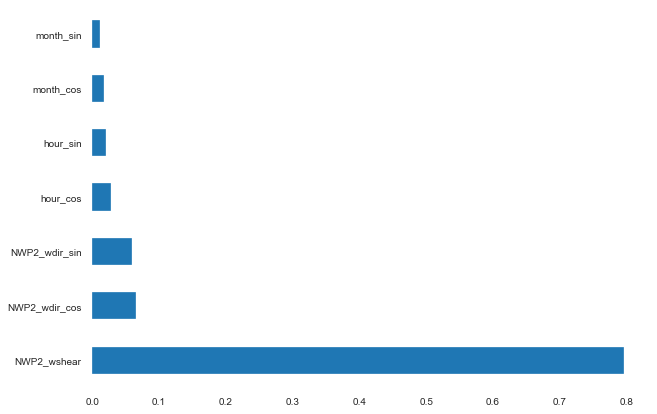

In [31]:
## Feature importance for NWP2

# data
X2 = X_train_cpy[['NWP2_wshear','NWP2_wdir_cos','NWP2_wdir_sin',
                'hour_cos','hour_sin',
                'month_sin','month_cos']]
Y2 = y_train['Production']

# split into train and test sets
train_x2, test_x2, train_y2, test_y2 = train_test_split(X2, Y2, test_size=0.20, random_state=0)

# instanciate object RandomForestRegressor
model_RFR_NWP2 = RandomForestRegressor()

# fit the model
model_RFR_NWP2.fit(train_x2, train_y2)

# plot feature importance
plt.figure(figsize=(10,7))
feat_importances = pd.Series(model_RFR_NWP2.feature_importances_, index = train_x2.columns)
feat_importances.nlargest(50).plot(kind='barh')

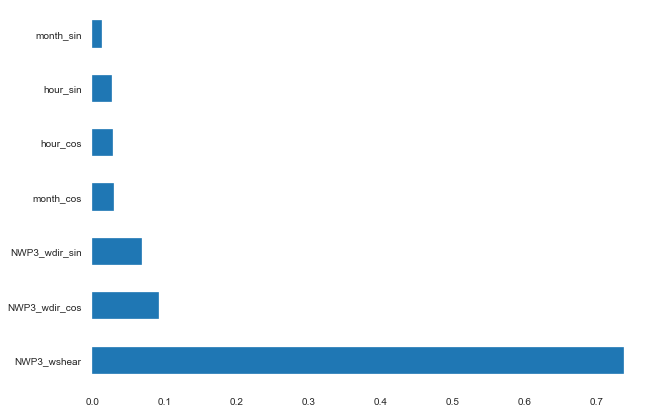

In [32]:
## Feature importance for NWP3

# data
X3 = X_train_cpy[['NWP3_wshear','NWP3_wdir_cos','NWP3_wdir_sin',
                'hour_cos','hour_sin','month_sin','month_cos']]
Y3 = y_train['Production']

# split into train and test sets
train_x3, test_x3, train_y3, test_y3 = train_test_split(X3, Y3, test_size=0.20, random_state=0)

# instanciate object RandomForestRegressor
model_RFR_NWP3 = RandomForestRegressor()

# fit the model
model_RFR_NWP3.fit(train_x3, train_y3)

# plot feature importance
plt.figure(figsize=(10,7))
feat_importances = pd.Series(model_RFR_NWP3.feature_importances_, index = train_x3.columns)
feat_importances.nlargest(50).plot(kind='barh')

In [33]:
X_train_cpy.head()

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos
0,2018-05-01 01:00:00,1,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,283.003572,-0.974356,0.225012,1.613397,1,5,0.258819,0.965926,0.5,-0.866025
1,2018-05-01 02:00:00,2,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,279.424060,-0.986503,0.163740,3.162259,2,5,0.500000,0.866025,0.5,-0.866025
2,2018-05-01 03:00:00,3,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,324.830561,-0.575996,0.817452,2.168512,3,5,0.707107,0.707107,0.5,-0.866025
3,2018-05-01 04:00:00,4,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,324.355114,-0.582760,0.812644,1.482078,4,5,0.866025,0.500000,0.5,-0.866025
4,2018-05-01 05:00:00,5,WF1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,315.381966,-0.702377,0.711805,0.519041,5,5,0.965926,0.258819,0.5,-0.866025


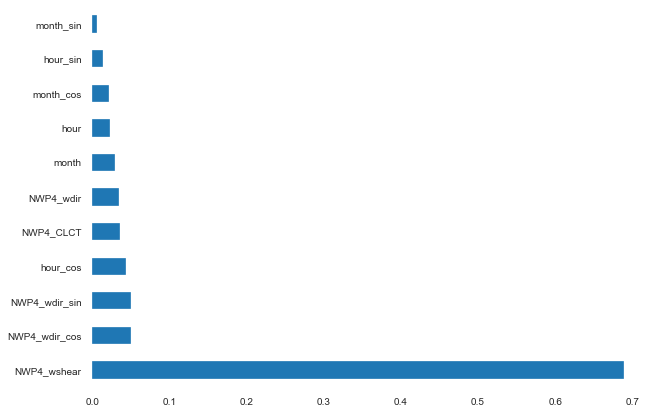

In [34]:
## Feature importance for NWP4

# data
X4 = X_train_cpy[['NWP4_CLCT','NWP4_wshear','NWP4_wdir_cos','NWP4_wdir','NWP4_wdir_sin', 'hour','month',
                'hour_cos','hour_sin','month_sin','month_cos']]
Y4 = y_train['Production']

# split into train and test sets
train_x4, test_x4, train_y4, test_y4 = train_test_split(X4, Y4, test_size=0.20, random_state=0)

# instanciate object RandomForestRegressor
model_RFR_NWP4 = RandomForestRegressor()

# fit the model
model_RFR_NWP4.fit(train_x4, train_y4)

# plot feature importance
plt.figure(figsize=(10,7))
feat_importances = pd.Series(model_RFR_NWP4.feature_importances_, index = train_x4.columns)
feat_importances.nlargest(50).plot(kind='barh')

#### Visualization  of the sub-feature space selected 

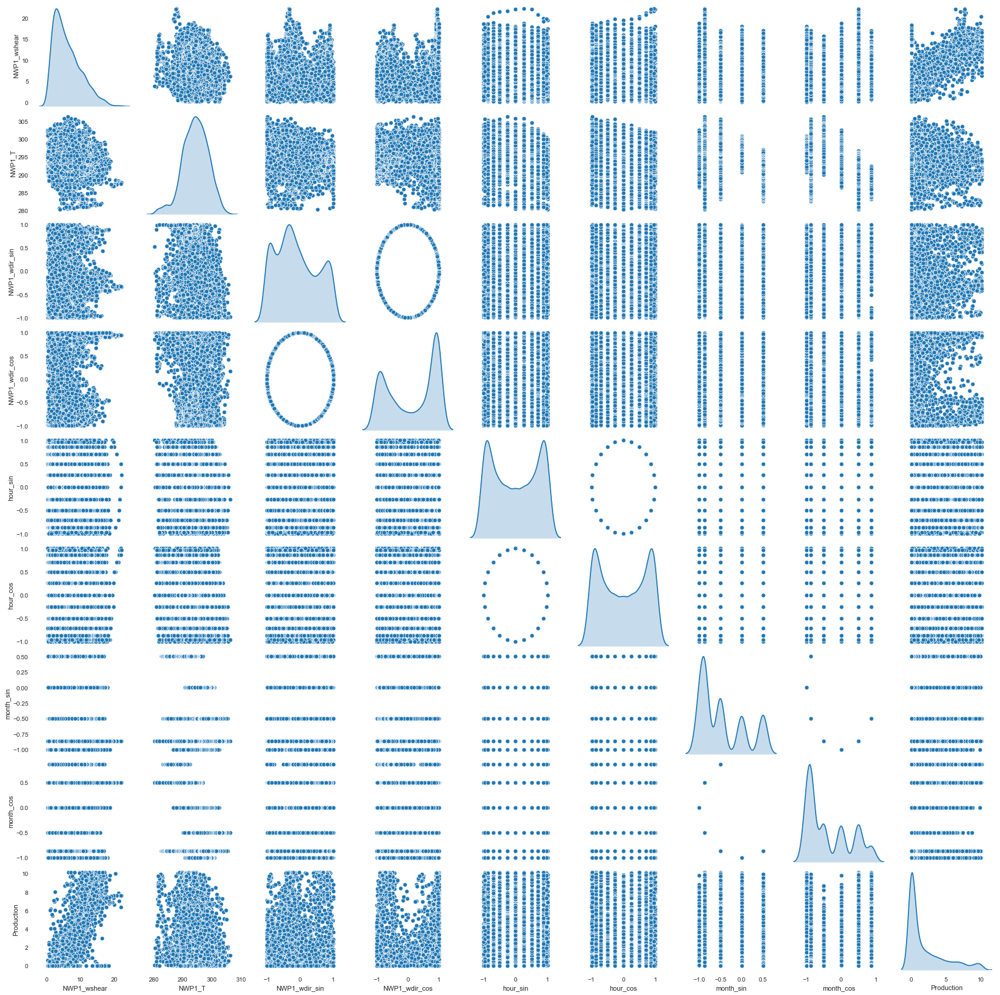

In [35]:
sns.pairplot(
    df_eda,
    vars = ['NWP1_wshear', 'NWP1_T',
           'NWP1_wdir_sin', 'NWP1_wdir_cos',
           'hour_sin','hour_cos',
           'month_sin','month_cos',
           'Production'],
    diag_kind='kde'
)

### Feature transformations
<a id="feat_transformation"></a>

#### Temperature convertion to $^{\text{o}}$C

In [36]:
temps = ['NWP1_T', 'NWP3_T']

dtr.convert_to_celsius(X_train_cpy, temps)
dtr.convert_to_celsius(X_test_cpy, temps)

,Time,ID,WF,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,...,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos
0,2018-11-14 00:00:00,4727,WF1,-2.121094,-2.443359,287.50,-1.804688,-3.511719,287.00,-2.726562,...,35.331721,0.578309,0.815818,1.859450,0,11,0.000000,1.000000,-0.5,0.866025
1,2018-11-14 01:00:00,4728,WF1,-1.703125,-0.535645,287.00,-1.742188,-2.023438,286.75,-2.023438,...,38.772632,0.626231,0.779637,1.746459,1,11,0.258819,0.965926,-0.5,0.866025
2,2018-11-14 02:00:00,4729,WF1,-1.638672,0.705566,287.00,-1.274414,-0.818359,286.50,-1.580078,...,48.087651,0.744168,0.667993,1.879020,2,11,0.500000,0.866025,-0.5,0.866025
3,2018-11-14 03:00:00,4730,WF1,-1.932617,1.438477,287.00,-1.029297,-0.264404,286.25,-1.255859,...,32.878425,0.542858,0.839824,2.323422,3,11,0.707107,0.707107,-0.5,0.866025
4,2018-11-14 04:00:00,4731,WF1,-2.136719,2.640625,286.75,-1.157227,0.812012,286.25,-1.219727,...,50.877393,0.775797,0.630982,2.128831,4,11,0.866025,0.500000,-0.5,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,2019-01-15 20:00:00,6235,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.347412,...,355.928296,-0.071005,0.997476,3.230496,20,1,-0.866025,0.500000,0.5,0.866025
1509,2019-01-15 21:00:00,6236,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.261230,...,6.087915,0.106054,0.994360,2.842000,21,1,-0.707107,0.707107,0.5,0.866025
1510,2019-01-15 22:00:00,6237,WF1,NaN,NaN,NaN,NaN,NaN,NaN,0.230469,...,20.642802,0.352541,0.935796,2.836836,22,1,-0.500000,0.866025,0.5,0.866025
1511,2019-01-15 23:00:00,6238,WF1,NaN,NaN,NaN,NaN,NaN,NaN,-0.038696,...,13.147954,0.227466,0.973786,2.449779,23,1,-0.258819,0.965926,0.5,0.866025


#### Power  tranformations (Box-Cox and Yeo-Johnson)

Some of the features, like wind speed, have skewed distributions. Box-Cox and Yeo-Johnson transformations can be used to get a more Gaussian like distribution. The Box-Cox family transformation is as follows:

$$ \begin{split}x_i^{(\lambda)} =
\begin{cases}
\dfrac{x_i^\lambda - 1}{\lambda} & \text{if } \lambda \neq 0, \\[8pt]
\ln{(x_i)} & \text{if } \lambda = 0,
\end{cases}\end{split} $$

where $\lambda$ can be estimated from the traning data. This transformations can only be applied on positive data. 

Yeo-Johnson transformations can be applied on positive and negative data, given by:

$$
\begin{split}x_i^{(\lambda)} =
\begin{cases}
 [(x_i + 1)^\lambda - 1] / \lambda & \text{if } \lambda \neq 0, x_i \geq 0, \\[8pt]
\ln{(x_i + 1)} & \text{if } \lambda = 0, x_i \geq 0 \\[8pt]
-[(-x_i + 1)^{2 - \lambda} - 1] / (2 - \lambda) & \text{if } \lambda \neq 2, x_i < 0, \\[8pt]
 - \ln (- x_i + 1) & \text{if } \lambda = 2, x_i < 0
\end{cases}\end{split}
$$

We'll try such transformations on our training data set, concretely Yeo-Johnson as we have some predictors with negative values.

In [37]:
from sklearn.preprocessing import PowerTransformer

# Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson', standardize=True)
x_trnsf = pt.fit_transform(df_eda[['NWP1_wshear', 'NWP1_T',
           'NWP1_wdir_sin', 'NWP1_wdir_cos',
           'hour_sin','hour_cos',
           'month_sin','month_cos']])

x_trnsf_df = pd.DataFrame(data=x_trnsf)

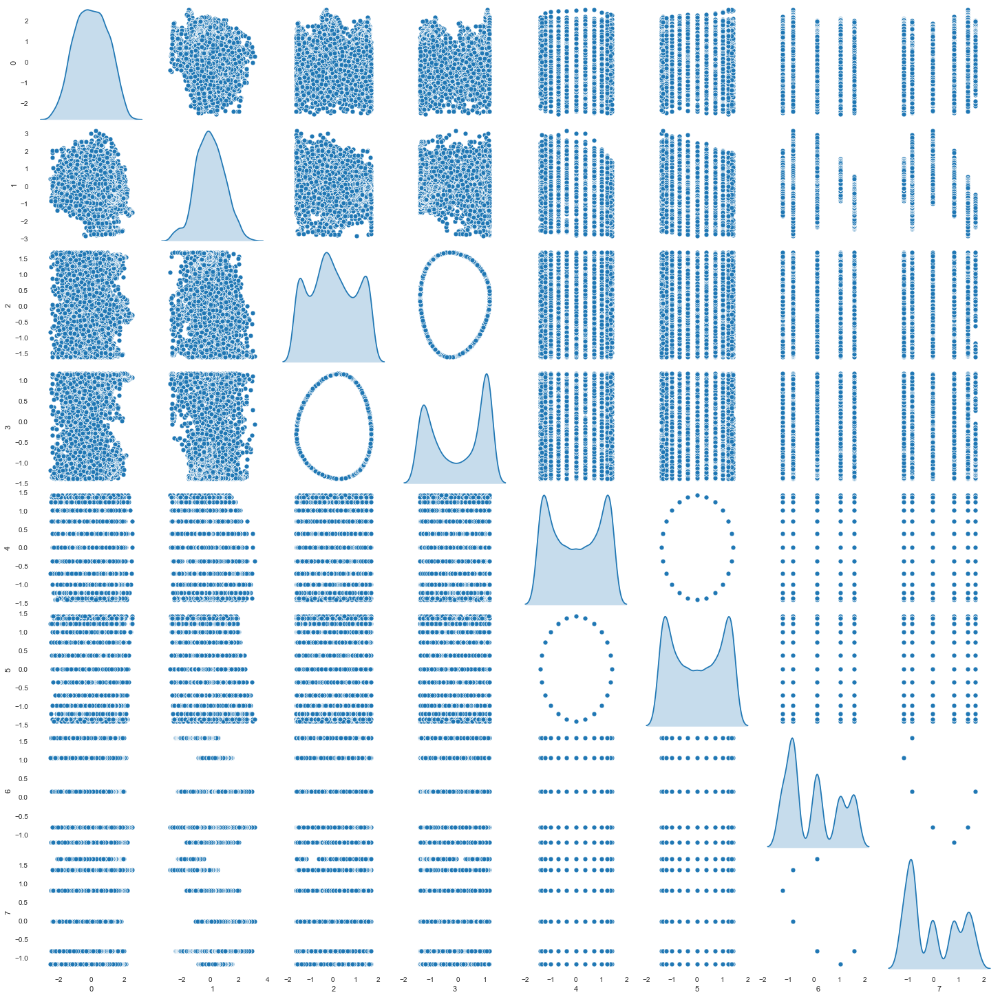

In [38]:
sns.pairplot(
    x_trnsf_df,
    diag_kind='kde'
)

In [39]:
pt.lambdas_

array([ 0.16093679,  8.11613958,  0.6491433 ,  1.36305448,  0.99943066,
        0.99911404, -0.20641495,  0.02812757])

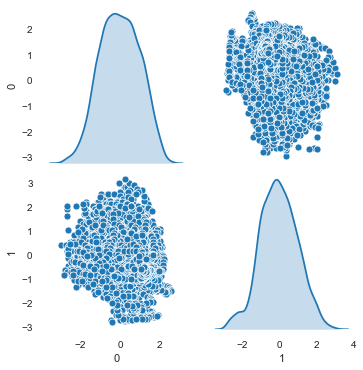

In [40]:
pt = PowerTransformer(method='box-cox', standardize=True)
x_trnsf = pt.fit_transform(df_eda[['NWP1_wshear', 'NWP1_T']])
x_trnsf_df = pd.DataFrame(data=x_trnsf)
sns.pairplot(x_trnsf_df,diag_kind='kde')

In [41]:
pt.lambdas_

array([0.32880318, 8.09194629])

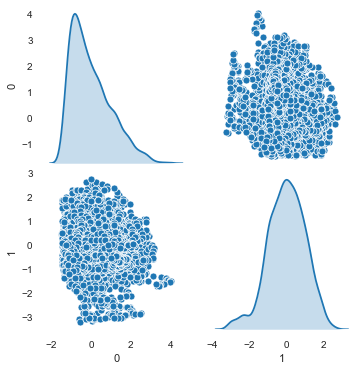

In [42]:
# standard scaler
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
x_trnsf = ss.fit_transform(df_eda[['NWP1_wshear', 'NWP1_T']])
x_trnsf_df = pd.DataFrame(data=x_trnsf)
sns.pairplot(x_trnsf_df,diag_kind='kde')

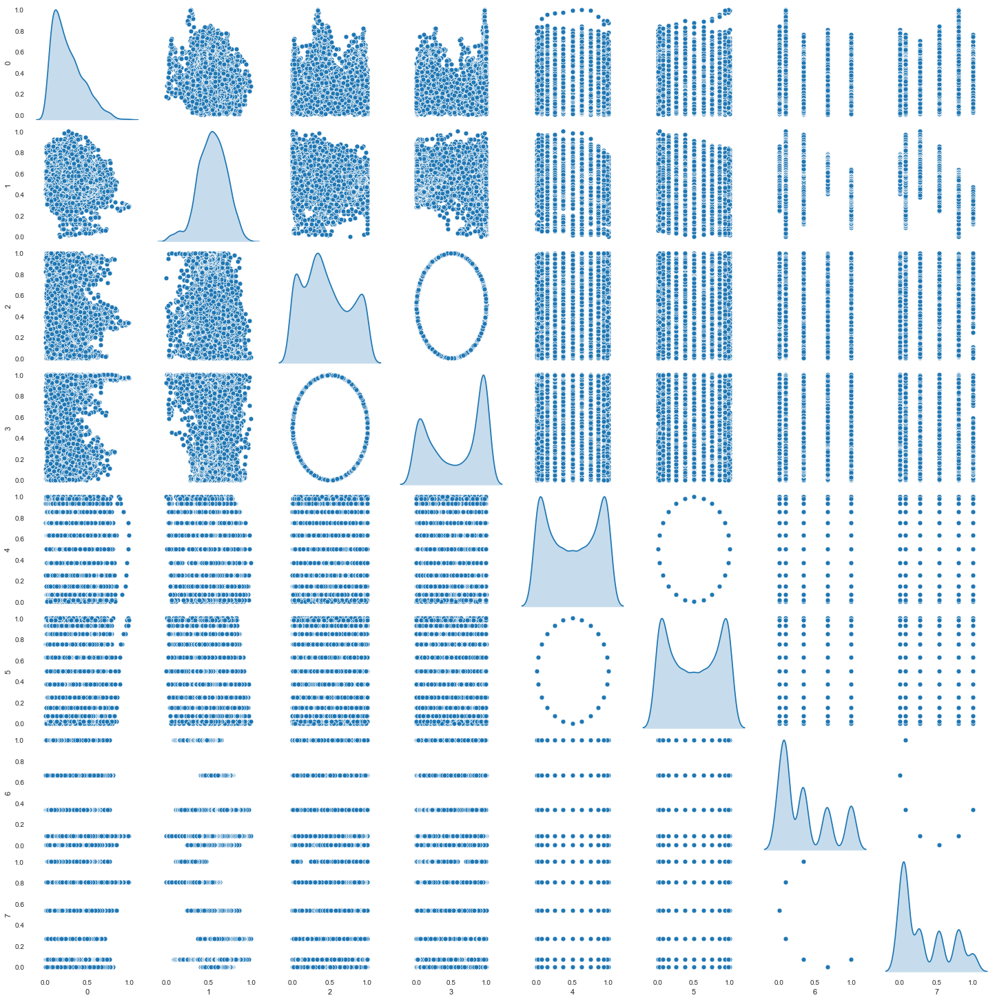

In [43]:
# MinMax transformation
from sklearn.preprocessing import MinMaxScaler

mm = MinMaxScaler()
x_trnsf = mm.fit_transform(df_eda[['NWP1_wshear', 'NWP1_T',
           'NWP1_wdir_sin', 'NWP1_wdir_cos',
           'hour_sin','hour_cos',
           'month_sin','month_cos']])

x_trnsf_df = pd.DataFrame(data=x_trnsf)
sns.pairplot(x_trnsf_df,diag_kind='kde')

## Target transfomation
<a id="target_transformation"></a>

The target (power production by the WF) has a very right skewed distribution also:

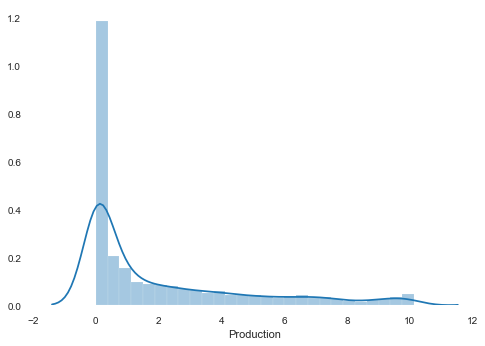

In [44]:
sns.distplot(df_eda['Production'], kde=True)

C:\Users\Quark\.conda\envs\TFM-env\lib\site-packages\numpy\core\_methods.py:199: RuntimeWarning:

overflow encountered in reduce



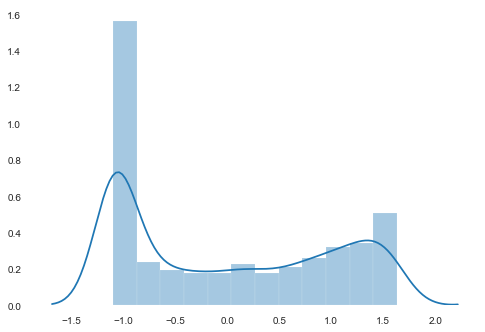

In [45]:
mm = PowerTransformer(method='yeo-johnson', standardize=True)
y_trnsf = mm.fit_transform(np.array(df_eda['Production']).reshape(-1,1))

sns.distplot(y_trnsf, kde=True)

We may also use a power transformation to handle the skeweness of the target distribution (more appropriate in this case than the log transformation, as the target has many 0 values).

## Outliers and abnormal data
<a id="outliers"></a>

In weather parameters (except `CLCT`) there's no abnormal data, as we saw in notebook `1.1-vcp-explore-data`. We need to focus on the following four types of outliers:
1. Data points in low wind speed period with high power generation.
2. Data points with negtative value wind speed.
3. Data points with negative value power generation.
4. Data points with low power generation at high wind speed period.

Let's have a quick look at the data sets to check types 2 and 3:

In [47]:
pd.options.display.max_columns = None
df_eda[df_eda.columns[-38:]].describe()

,NWP1_V,NWP1_T,NWP2_U,NWP2_V,NWP3_U,NWP3_V,NWP3_T,NWP4_U,NWP4_V,NWP4_CLCT,NWP1_wvel,NWP1_wdir,NWP1_wdir_sin,NWP1_wdir_cos,NWP1_wshear,NWP2_wvel,NWP2_wdir,NWP2_wdir_sin,NWP2_wdir_cos,NWP2_wshear,NWP3_wvel,NWP3_wdir,NWP3_wdir_sin,NWP3_wdir_cos,NWP3_wshear,NWP4_wvel,NWP4_wdir,NWP4_wdir_sin,NWP4_wdir_cos,NWP4_wshear,hour,month,hour_sin,hour_cos,month_sin,month_cos,Production,NWP3_T_cels
count,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4726.000000,4.726000e+03,4.726000e+03,4.726000e+03,4.726000e+03,4726.000000,4726.000000
mean,-1.824356,294.388013,0.825424,-1.704653,0.902801,-1.761154,294.816265,0.663919,-1.214896,43.329247,6.733088,216.859118,-0.101022,0.139539,6.110406,6.255511,224.518020,-0.112785,0.148306,5.676996,5.764107,235.204900,-0.172319,0.187789,5.231037,4.361275,227.568358,-0.096490,0.201710,5.463479,11.504444,7.731062,-1.057977e-04,-3.948424e-04,-4.579517e-01,-3.677698e-01,2.035156,21.816265
std,6.443851,4.345704,4.086430,5.875817,3.619370,5.668641,4.812405,2.668298,4.277391,43.388363,4.425249,111.010421,0.602441,0.779483,4.015998,3.958833,108.128963,0.599186,0.778759,3.592717,3.989851,106.275441,0.566006,0.784141,3.620866,2.882415,111.011062,0.568862,0.791580,3.610873,6.920981,1.866960,7.072938e-01,7.070693e-01,5.232912e-01,6.175197e-01,2.751953,4.812405
min,-23.109375,280.250000,-17.968750,-18.343750,-16.468750,-21.046875,278.500000,-10.398438,-14.109375,-0.000027,0.145889,0.145213,-1.000000,-1.000000,0.132397,0.042168,0.035529,-1.000000,-1.000000,0.038269,0.129671,0.104028,-1.000000,-1.000000,0.117679,0.083583,0.172762,-0.999999,-1.000000,0.104707,0.000000,5.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,0.000000,5.500000
25%,-6.361328,291.500000,-1.239746,-6.041016,-0.466431,-5.677734,291.750000,-0.693115,-3.902832,-0.000012,3.218672,134.800311,-0.580575,-0.702360,2.921007,3.107676,141.380566,-0.590974,-0.703749,2.820275,2.707667,154.599409,-0.579280,-0.682086,2.457260,1.919156,143.448493,-0.522918,-0.715121,2.404175,6.000000,6.000000,-7.071068e-01,-7.071068e-01,-8.660254e-01,-8.660254e-01,0.010002,18.750000
50%,-0.963623,294.500000,1.003703,-1.105876,1.221965,-1.153971,294.833333,0.607422,-1.045898,30.187500,5.712872,225.710291,-0.191963,0.366089,5.184541,5.344862,237.775790,-0.233676,0.443001,4.850565,4.543265,255.458335,-0.297867,0.585226,4.123100,3.888649,246.835150,-0.207376,0.615791,4.871408,12.000000,8.000000,6.123234e-17,-1.836970e-16,-5.000000e-01,-5.000000e-01,0.640137,21.833333
75%,2.818359,297.500000,3.465983,2.622721,3.010905,2.321777,298.333333,2.417480,1.903320,97.562500,9.374758,328.215443,0.382770,0.926410,8.507772,8.927445,330.392984,0.405149,0.916714,8.101827,8.216809,333.965437,0.175311,0.926674,7.456911,6.162310,333.222812,0.343399,0.930305,7.719681,17.750000,9.000000,7.071068e-01,7.071068e-01,1.224647e-16,-1.836970e-16,3.230469,25.333333
max,16.484375,306.250000,13.921875,15.156250,11.703125,13.085938,308.500000,11.101562,9.242188,100.000000,24.519510,359.973840,1.000000,1.000000,22.251925,19.756243,359.953316,1.000000,1.000000,17.929169,21.502362,359.982738,0.999996,1.000000,19.513806,14.749521,359.957072,1.000000,1.000000,18.477095,23.000000,11.000000,1.000000e+00,1.000000e+00,5.000000e-01,8.660254e-01,10.132812,35.500000


There isn't any type 2 neither 3 outliers. However, looking at `CLCT`, which represents the cloud coverage percentage, we see the minimum value is negative, which makes nonsense. 

In [48]:
for val in df_eda['NWP4_CLCT'].sort_values(ascending=True):
    print(val)

-2.7120113372802734e-05
-2.7000904083251953e-05
-2.7000904083251953e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.658367156982422e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.5987625122070312e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.568960189819336e-05
-2.5510787963867188e-05
-2.5510787963867188e-05
-2.5510787963867188e-05
-2.5510787963867188e-05
-2.5510787963867188e-05
-2.5212764739990234e-05
-2.5212764739990234e-05
-2.5212764739

26.515625
26.5625
26.5625
26.59375
26.671875
26.71875
26.921875
27.0
27.0
27.03125
27.078125
27.171875
27.203125
27.25
27.3125
27.359375
27.421875
27.46875
27.515625
27.90625
27.90625
27.9375
28.0625
28.078125
28.140625
28.203125
28.234375
28.25
28.3125
28.328125
28.359375
28.4375
28.4375
28.578125
28.734375
28.75
28.765625
28.796875
28.796875
28.96875
29.265625
29.4375
29.46875
29.5625
29.578125
29.625
29.671875
29.671875
29.796875
29.8125
29.84375
29.875
29.921875
29.921875
30.03125
30.125
30.15625
30.21875
30.3125
30.375
30.421875
30.5625
30.578125
30.8125
31.375
31.390625
31.453125
31.46875
31.828125
31.984375
31.984375
31.984375
32.0
32.0625
32.0625
32.21875
32.25
32.28125
32.3125
32.34375
32.375
32.46875
32.5
32.5
32.6875
32.71875
32.84375
32.90625
32.90625
32.96875
33.0625
33.09375
33.125
33.125
33.15625
33.28125
33.34375
33.34375
33.40625
33.625
33.625
33.71875
33.8125
33.875
34.0
34.0625
34.0625
34.09375
34.28125
34.4375
34.4375
34.53125
34.59375
34.625
34.625
34.75
34.78125
3

100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.0
100.

Negative values are very close to 0, it makes sense to replace all these observations by 0.

In [49]:
X_train_cpy.loc[X_train_cpy['NWP4_CLCT'] < 0, 'NWP4_CLCT'] = 0.0
X_test_cpy.loc[X_test_cpy['NWP4_CLCT'] < 0, 'NWP4_CLCT'] = 0.0

In [50]:
X_train_cpy['NWP4_CLCT'].sort_values(ascending=True)

3189      0.0
1240      0.0
1239      0.0
1238      0.0
1237      0.0
        ...  
3901    100.0
3900    100.0
3899    100.0
3905    100.0
3181    100.0
Name: NWP4_CLCT, Length: 4726, dtype: float64

#### Trying some ML algorithms to detect outliers

In [51]:
# Import models
from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF
from pyod.models.hbos import HBOS
from pyod.models.lof import LOF
from pyod.models.ocsvm import OCSVM

from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.font_manager

df = df_eda[['NWP1_wvel','Production']]

mm = PowerTransformer(method='yeo-johnson', standardize=True)

X1 = mm.fit_transform(np.array(df['NWP1_wvel']).reshape(-1,1))
X2 = mm.fit_transform(np.array(df_eda['Production']).reshape(-1,1))

#X1 = df['NWP1_wvel'].values.reshape(-1,1)
#X2 = df['Production'].values.reshape(-1,1)
X = np.concatenate((X1,X2), axis=1)

random_state = np.random.RandomState(42)
outliers_fraction = 0.10

# Define seven outlier detection tools to be compared
classifiers = {
        'One-class SVM detector (OCSVM)': OCSVM(contamination=outliers_fraction), 
        #'Angle-based Outlier Detector (ABOD)': ABOD(contamination=outliers_fraction),
        #'Isolation Forest': IForest(contamination=outliers_fraction,random_state=random_state, n_estimators=10000),
        #'K Nearest Neighbors (KNN)': KNN(contamination=outliers_fraction, radius=0.05),
        #'Average KNN': KNN(method='mean',contamination=outliers_fraction, n_neighbors=9)
}


C:\Users\Quark\.conda\envs\TFM-env\lib\site-packages\numpy\core\_methods.py:122: RuntimeWarning:

overflow encountered in reduce



OUTLIERS :  473 INLIERS :  4253 One-class SVM detector (OCSVM)


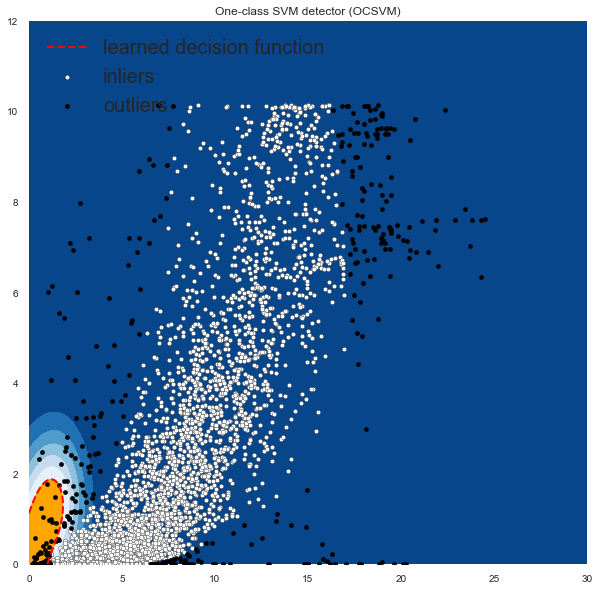

In [52]:
xx , yy = np.meshgrid(np.linspace(0, 30 , 200), np.linspace(0, 12, 200))

for i, (clf_name, clf) in enumerate(classifiers.items()):
    clf.fit(X)
    # predict raw anomaly score
    scores_pred = clf.decision_function(X) * -1
        
    # prediction of a datapoint category outlier or inlier
    y_pred = clf.predict(X)
    n_inliers = len(y_pred) - np.count_nonzero(y_pred)
    n_outliers = np.count_nonzero(y_pred == 1)
    plt.figure(figsize=(10, 10))
    
    # copy of dataframe
    dfx = df
    dfx['outlier'] = y_pred.tolist()
    
    # IX1 - inlier feature 1,  IX2 - inlier feature 2
    IX1 =  np.array(dfx['NWP1_wvel'][dfx['outlier'] == 0]).reshape(-1,1)
    IX2 =  np.array(dfx['Production'][dfx['outlier'] == 0]).reshape(-1,1)
    
    # OX1 - outlier feature 1, OX2 - outlier feature 2
    OX1 =  dfx['NWP1_wvel'][dfx['outlier'] == 1].values.reshape(-1,1)
    OX2 =  dfx['Production'][dfx['outlier'] == 1].values.reshape(-1,1)
         
    print('OUTLIERS : ',n_outliers,'INLIERS : ',n_inliers, clf_name)
        
    # threshold value to consider a datapoint inlier or outlier
    threshold = stats.scoreatpercentile(scores_pred,100 * outliers_fraction)
        
    # decision function calculates the raw anomaly score for every point
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
    Z = Z.reshape(xx.shape)
          
    # fill blue map colormap from minimum anomaly score to threshold value
    plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),cmap=plt.cm.Blues_r)
        
    # draw red contour line where anomaly score is equal to thresold
    a = plt.contour(xx, yy, Z, levels=[threshold],linewidths=2, colors='red')
        
    # fill orange contour lines where range of anomaly score is from threshold to maximum anomaly score
    plt.contourf(xx, yy, Z, levels=[threshold, Z.max()],colors='orange')
        
    b = plt.scatter(IX1,IX2, c='white',s=20, edgecolor='k')
    
    c = plt.scatter(OX1,OX2, c='black',s=20, edgecolor='k')
       
    plt.axis('tight')  
    
    # loc=2 is used for the top left corner 
    plt.legend(
        [a.collections[0], b,c],
        ['learned decision function', 'inliers','outliers'],
        prop=matplotlib.font_manager.FontProperties(size=20),
        loc=2)
      
    plt.xlim((0, 30))
    plt.ylim((0, 12))
    plt.title(clf_name)
    plt.show()

In [53]:
# prediction of a datapoint category outlier or inlier
y_pred = clf.predict(X)
n_inliers = len(y_pred) - np.count_nonzero(y_pred)
n_outliers = np.count_nonzero(y_pred == 1)

# copy of dataframe
dfx = df
dfx['outlier'] = y_pred.tolist()

In [54]:
X1 = np.array(df['NWP1_wvel']).reshape(-1,1)
X2 = np.array(df_eda['Production']).reshape(-1,1)
X = np.concatenate((X1,X2), axis=1)

In [55]:
X.shape

(4726, 2)

In [56]:
import hdbscan

mm = StandardScaler()

X1 = mm.fit_transform(np.array(df['NWP1_wvel']).reshape(-1,1))
X2 = mm.fit_transform(np.array(df_eda['Production']).reshape(-1,1))
X = mm.fit_transform(np.concatenate((X1,X2), axis=1))

clusterer = hdbscan.HDBSCAN(min_cluster_size=15, min_samples=25).fit(X)

In [57]:
clusterer

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
        approx_min_span_tree=True, cluster_selection_epsilon=0.0,
        cluster_selection_method='eom', core_dist_n_jobs=4,
        gen_min_span_tree=False, leaf_size=40,
        match_reference_implementation=False, memory=Memory(location=None),
        metric='euclidean', min_cluster_size=15, min_samples=25, p=None,
        prediction_data=False)

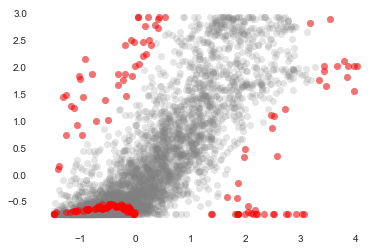

In [58]:
threshold = pd.Series(clusterer.outlier_scores_).quantile(0.96)
outliers = np.where(clusterer.outlier_scores_ > threshold)[0]
plt.scatter(*X.T, s=50, linewidth=0, c='gray', alpha=0.20)
plt.scatter(*X[outliers].T, s=50, linewidth=0, c='red', alpha=0.5)

In [59]:
outliers

array([  51,   52,   96,   98,  161,  183,  255,  258,  270,  391,  422,
        436,  454,  494,  519,  537,  617,  638,  650,  653,  721,  725,
        732,  735,  748,  768,  850,  880,  895,  976,  997,  998, 1019,
       1200, 1215, 1285, 1286, 1288, 1290, 1453, 1476, 1478, 1488, 1532,
       1560, 1748, 1787, 1792, 1878, 1950, 2004, 2022, 2028, 2049, 2081,
       2089, 2090, 2176, 2196, 2197, 2267, 2323, 2418, 2482, 2506, 2577,
       2579, 2629, 2634, 2673, 2750, 2755, 2845, 2866, 2878, 2972, 2973,
       3004, 3006, 3016, 3051, 3058, 3059, 3060, 3081, 3206, 3228, 3232,
       3302, 3305, 3366, 3419, 3426, 3446, 3514, 3542, 3550, 3691, 3692,
       3693, 3694, 3695, 3696, 3697, 3698, 3699, 3700, 3701, 3702, 3819,
       3842, 3855, 3865, 3871, 3874, 3875, 3876, 3880, 3881, 3883, 3920,
       3921, 3922, 3923, 3945, 4006, 4009, 4010, 4011, 4012, 4013, 4014,
       4015, 4016, 4017, 4018, 4019, 4020, 4021, 4022, 4023, 4024, 4025,
       4026, 4027, 4028, 4029, 4030, 4031, 4032, 40

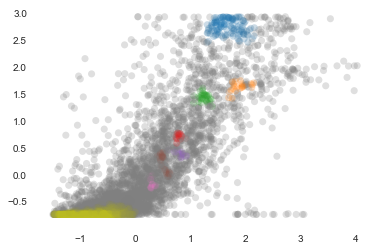

In [60]:
color_palette = sns.color_palette()
cluster_colors = [color_palette[x] if x >= 0 else (0.5, 0.5, 0.5) for x in clusterer.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, clusterer.probabilities_)]
plt.scatter(*X.T, s=50, linewidth=0, c=cluster_member_colors, alpha=0.25)

In [61]:
clusterer.labels_.shape

(4726,)

In [71]:
## With DBSCAN 
from sklearn.cluster import DBSCAN
outlier_detection = DBSCAN(
    eps = 0.1,
    metric="l1",
    min_samples = 10,
    n_jobs = -1)


mm = PowerTransformer(method='yeo-johnson', standardize=True)

X1 = mm.fit_transform(np.array(df['NWP1_wvel']).reshape(-1,1))
X2 = mm.fit_transform(np.array(df_eda['Production']).reshape(-1,1))
X = np.concatenate((X1,X2), axis=1)

clusters = outlier_detection.fit_predict(X)

C:\Users\Quark\.conda\envs\TFM-env\lib\site-packages\numpy\core\_methods.py:122: RuntimeWarning:

overflow encountered in reduce



In [72]:
outliers = np.where(clusters == -1)[0]

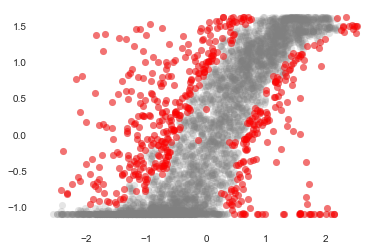

In [73]:
plt.scatter(*X.T, s=50, linewidth=0, c='gray', alpha=0.20)
plt.scatter(*X[outliers].T, s=50, linewidth=0, c='red', alpha=0.5)

In [198]:
df.shape

(4218, 3)

In [64]:
%store X_train_cpy
%store X_test_cpy
%store y_train
%store y_test

Stored 'X_train_cpy' (DataFrame)
Stored 'X_test_cpy' (DataFrame)
Stored 'y_train' (DataFrame)
Stored 'y_test' (DataFrame)


In [65]:
X_test.head()

,ID,WF,Time,NWP1_00h_D-2_U,NWP1_00h_D-2_V,NWP1_00h_D-2_T,NWP1_06h_D-2_U,NWP1_06h_D-2_V,NWP1_06h_D-2_T,NWP1_12h_D-2_U,NWP1_12h_D-2_V,NWP1_12h_D-2_T,NWP1_18h_D-2_U,NWP1_18h_D-2_V,NWP1_18h_D-2_T,NWP1_00h_D-1_U,NWP1_00h_D-1_V,NWP1_00h_D-1_T,NWP1_06h_D-1_U,NWP1_06h_D-1_V,NWP1_06h_D-1_T,NWP1_12h_D-1_U,NWP1_12h_D-1_V,NWP1_12h_D-1_T,NWP1_18h_D-1_U,NWP1_18h_D-1_V,NWP1_18h_D-1_T,NWP1_00h_D_U,NWP1_00h_D_V,NWP1_00h_D_T,NWP1_06h_D_U,NWP1_06h_D_V,NWP1_06h_D_T,NWP1_12h_D_U,NWP1_12h_D_V,NWP1_12h_D_T,NWP1_18h_D_U,NWP1_18h_D_V,NWP1_18h_D_T,NWP2_00h_D-2_U,NWP2_00h_D-2_V,NWP2_12h_D-2_U,NWP2_12h_D-2_V,NWP2_00h_D-1_U,NWP2_00h_D-1_V,NWP2_12h_D-1_U,NWP2_12h_D-1_V,NWP2_00h_D_U,NWP2_00h_D_V,NWP2_12h_D_U,NWP2_12h_D_V,NWP3_00h_D-2_U,NWP3_00h_D-2_V,NWP3_00h_D-2_T,NWP3_06h_D-2_U,NWP3_06h_D-2_V,NWP3_06h_D-2_T,NWP3_12h_D-2_U,NWP3_12h_D-2_V,NWP3_12h_D-2_T,NWP3_18h_D-2_U,NWP3_18h_D-2_V,NWP3_18h_D-2_T,NWP3_00h_D-1_U,NWP3_00h_D-1_V,NWP3_00h_D-1_T,NWP3_06h_D-1_U,NWP3_06h_D-1_V,NWP3_06h_D-1_T,NWP3_12h_D-1_U,NWP3_12h_D-1_V,NWP3_12h_D-1_T,NWP3_18h_D-1_U,NWP3_18h_D-1_V,NWP3_18h_D-1_T,NWP3_00h_D_U,NWP3_00h_D_V,NWP3_00h_D_T,NWP3_06h_D_U,NWP3_06h_D_V,NWP3_06h_D_T,NWP3_12h_D_U,NWP3_12h_D_V,NWP3_12h_D_T,NWP3_18h_D_U,NWP3_18h_D_V,NWP3_18h_D_T,NWP4_00h_D-2_U,NWP4_00h_D-2_V,NWP4_00h_D-2_CLCT,NWP4_12h_D-2_U,NWP4_12h_D-2_V,NWP4_12h_D-2_CLCT,NWP4_00h_D-1_U,NWP4_00h_D-1_V,NWP4_00h_D-1_CLCT,NWP4_12h_D-1_U,NWP4_12h_D-1_V,NWP4_12h_D-1_CLCT,NWP4_00h_D_U,NWP4_00h_D_V,NWP4_00h_D_CLCT,NWP4_12h_D_U,NWP4_12h_D_V,NWP4_12h_D_CLCT
4726,4727,WF1,2018-11-14 00:00:00,-2.121094,-2.443359,287.50,-1.804688,-3.511719,287.00,-2.726562,-1.971680,288.00,-1.393555,-2.113281,287.25,-2.416016,-1.206055,287.75,-2.482422,-1.552734,288.75,-2.052734,-0.610840,288.00,-1.327148,0.075684,288.25,-0.775879,0.379883,288.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.537598,-1.308594,-1.629883,-1.940430,-1.740234,-1.346680,-1.061523,-2.558594,-0.897461,-1.253906,NaN,NaN,-0.631836,-2.357422,288.75,-0.385498,-2.701172,288.75,-1.025391,-1.590820,289.25,-1.106445,-1.272461,289.25,-1.380859,-0.865723,289.5,-0.897949,-0.958008,289.25,-0.621094,-1.817383,288.75,-0.300049,-2.281250,288.75,-0.352295,-1.959961,288.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.137573,-1.619141,55.96875,-0.589355,-1.385742,43.65625,-0.858398,-1.210938,95.0625,-0.558594,-1.636719,56.28125,-0.411865,-1.547852,69.3125,NaN,NaN,NaN
4727,4728,WF1,2018-11-14 01:00:00,-1.703125,-0.535645,287.00,-1.742188,-2.023438,286.75,-2.023438,0.621094,287.75,-1.087891,-1.125000,287.00,-1.346680,0.587402,287.50,-2.048828,-0.392822,288.25,-1.606445,0.220581,287.50,-1.351562,-0.396973,287.75,-1.058594,-0.440430,288.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.815918,-1.104492,43.43750,-0.873047,-1.086914,81.7500,-0.671875,-1.813477,56.12500,-0.644531,-1.721680,70.0000,NaN,NaN,NaN
4728,4729,WF1,2018-11-14 02:00:00,-1.638672,0.705566,287.00,-1.274414,-0.818359,286.50,-1.580078,2.302734,287.75,-1.153320,-0.509766,287.00,-0.729004,1.084961,287.00,-1.618164,0.162842,287.75,-1.363281,0.717773,287.25,-1.526367,-0.616211,287.50,-1.458008,-0.799316,287.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.712891,-1.386719,44.53125,-1.116211,-1.001953,68.1875,-0.846191,-1.924805,57.71875,-0.875977,-1.833984,72.9375,NaN,NaN,NaN
4729,4730,WF1,2018-11-14 03:00:00,-1.932617,1.438477,287.00,-1.029297,-0.264404,286.25,-1.255859,3.173828,287.75,-1.645508,0.173096,286.75,-0.490479,1.434570,287.00,-1.506836,0.519531,287.50,-1.330078,1.135742,287.25,-1.512695,-0.535156,287.50,-1.546875,-0.858398,287.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.506836,-1.069336,-2.894531,0.127686,-2.833984,0.878418,-1.925781,-1.5